In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
!pip install ultralytics

from IPython import display

import ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 614.2/614.2 kB 6.8 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Hm8mdFJnlkZnoorR3Uy8")
project = rf.workspace("tennis-ai").project("football-boxes")
dataset = project.version(1).download("yolov8")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.7/58.7 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.6 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.0.76
    Uninstalling opencv-python-headless-4.8.0.76:
      Successfully uninstalled 

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.173, to fix: `pip install ultralytics==8.0.134`



Extracting Dataset Version Zip to football-boxes-1 in yolov8:: 100%|██████████| 1334/1334 [00:00<00:00, 3642.50it/s]


## Custom Training

In [ ]:
pwd


'/content'

In [ ]:
%cd {HOME}

!yolo task=segment mode=train model=yolov8l-seg.pt data={dataset.location}/data.yaml epochs=25 imgsz=640

/content
Ultralytics YOLOv8.0.173 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8l-seg.pt, data=/content/football-boxes-1/data.yaml, epochs=25, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscr

In [ ]:
!ls {HOME}/runs/segment/train3/

args.yaml					    results.csv
BoxF1_curve.png					    results.png
BoxP_curve.png					    train_batch0.jpg
BoxPR_curve.png					    train_batch1.jpg
BoxR_curve.png					    train_batch2.jpg
confusion_matrix_normalized.png			    train_batch540.jpg
confusion_matrix.png				    train_batch541.jpg
events.out.tfevents.1694274974.f51a2243d531.2891.0  train_batch542.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
MaskF1_curve.png				    val_batch1_labels.jpg
MaskP_curve.png					    val_batch1_pred.jpg
MaskPR_curve.png				    weights
MaskR_curve.png


/content


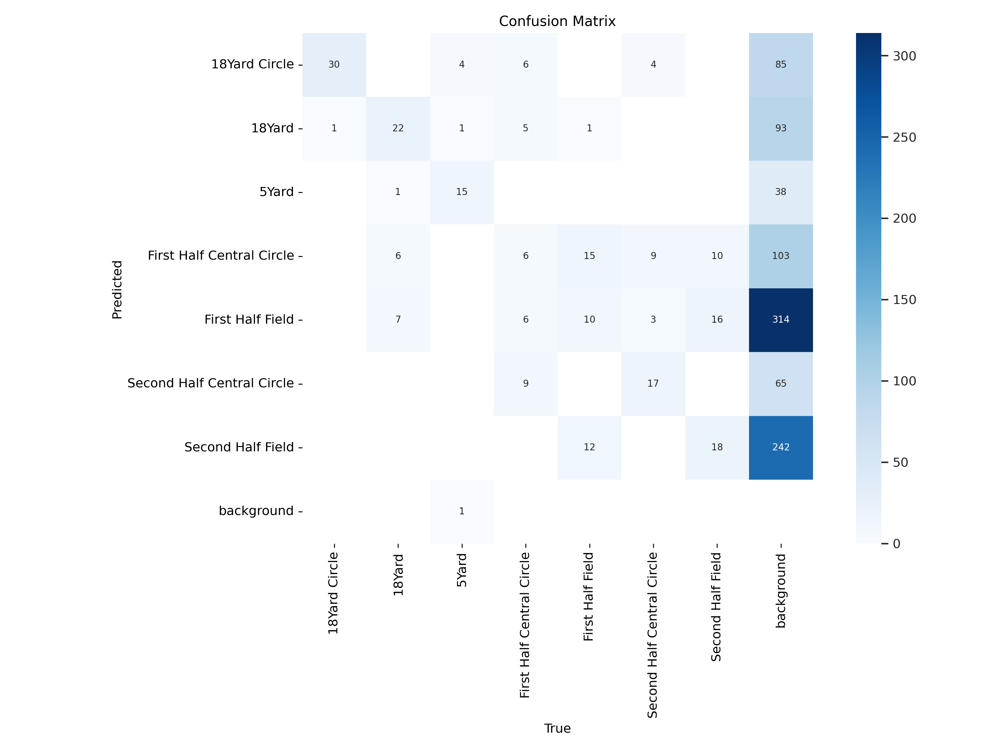

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train3/confusion_matrix.png', width=600)

/content


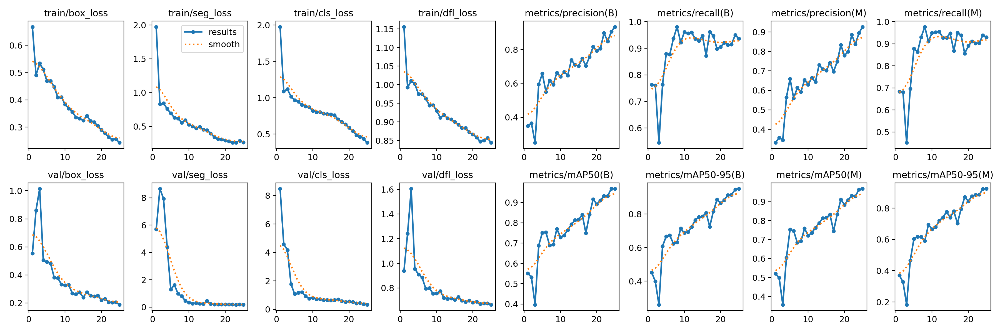

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/segment/train3/results.png', width=600)

## Validate Custom Model

In [ ]:
%cd {HOME}

!yolo task=segment mode=val model={HOME}/runs/segment/train3/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.173 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45917285 parameters, 0 gradients
val: Scanning /content/football-boxes-1/valid/labels.cache... 54 images, 0 backgrounds, 0 corrupt: 100% 54/54 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% 4/4 [00:05<00:00,  1.44s/it]
                   all         54        235      0.933      0.937      0.967       0.95      0.926       0.93      0.969      0.924
         18Yard Circle         54         31      0.978          1      0.995      0.967      0.978          1      0.995      0.915
                18Yard         54         36      0.946          1       0.99      0.955      0.946          1       0.99        0.9
                 5Yard         54         21      0.994      0.952      0.963      0.922      0.944      0.905      0.973      0.893
Fi


## Inference with Custom Model

In [ ]:
%cd {HOME}
!yolo task=segment mode=predict model={HOME}/runs/segment/train3/weights/best.pt conf=0.25 source=/content/video.mp4

/content
Ultralytics YOLOv8.0.173 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8l-seg summary (fused): 295 layers, 45917285 parameters, 0 gradients

video 1/1 (1/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 18Yard, 1 First Half Central Circle, 114.7ms
video 1/1 (2/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 18Yard, 1 First Half Central Circle, 41.9ms
video 1/1 (3/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 18Yard, 1 First Half Central Circle, 41.9ms
video 1/1 (4/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 18Yard, 1 First Half Central Circle, 41.9ms
video 1/1 (5/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 18Yard, 1 First Half Central Circle, 41.8ms
video 1/1 (6/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 18Yard, 1 First Half Central Circle, 32.1ms
video 1/1 (7/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 First Half Central Circle, 27.5ms
video 1/1 (8/395) /content/video.mp4: 384x640 1 18Yard Circle, 1 First Hal

In [ ]:
 !pip install -q matplotlib
!pip install -q moviepy

In [ ]:
import moviepy.editor as mp

video_path = "/content/runs/segment/predict3/video.avi"  # Replace with the actual filename of your video

video = mp.VideoFileClip(video_path)
video.ipython_display()

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


**NOTE:** Let's take a look at few results.

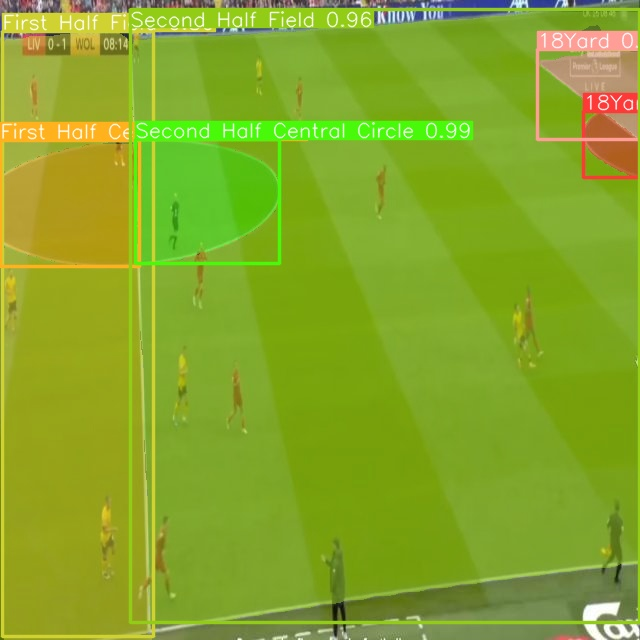

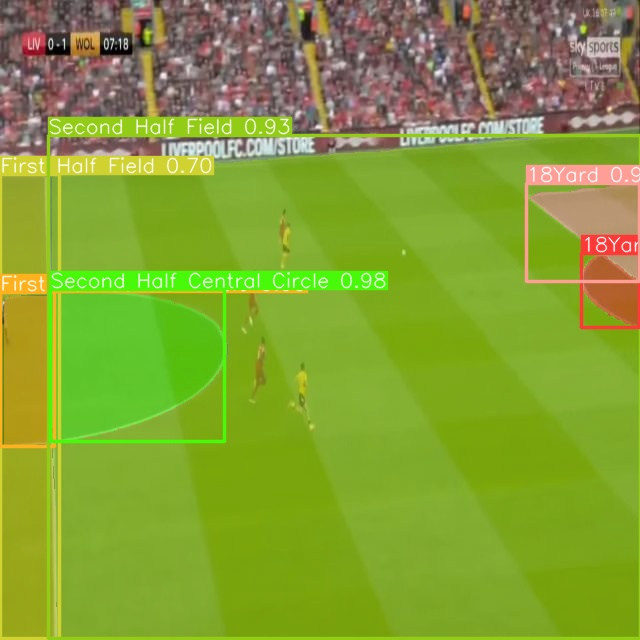

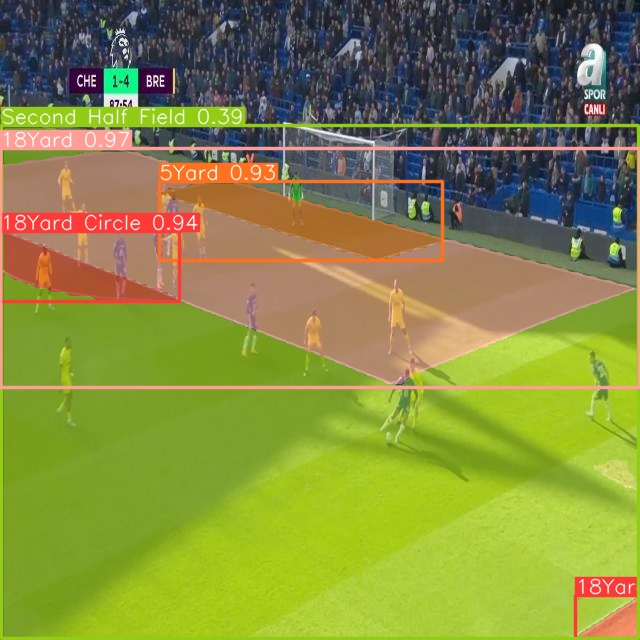

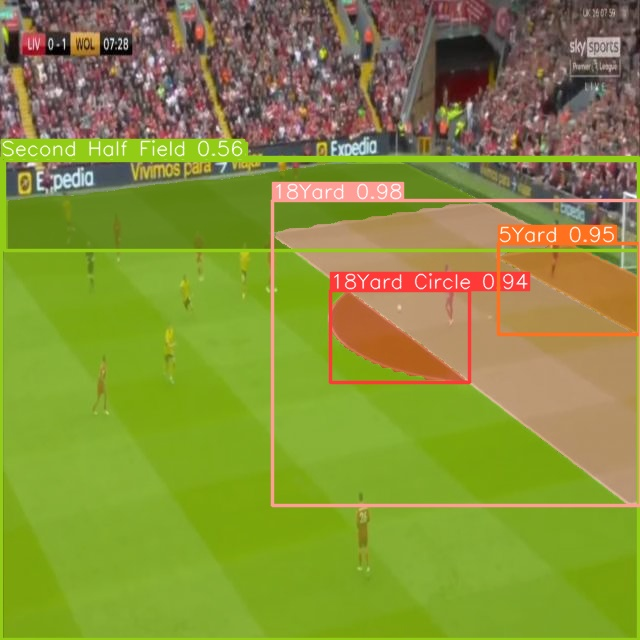

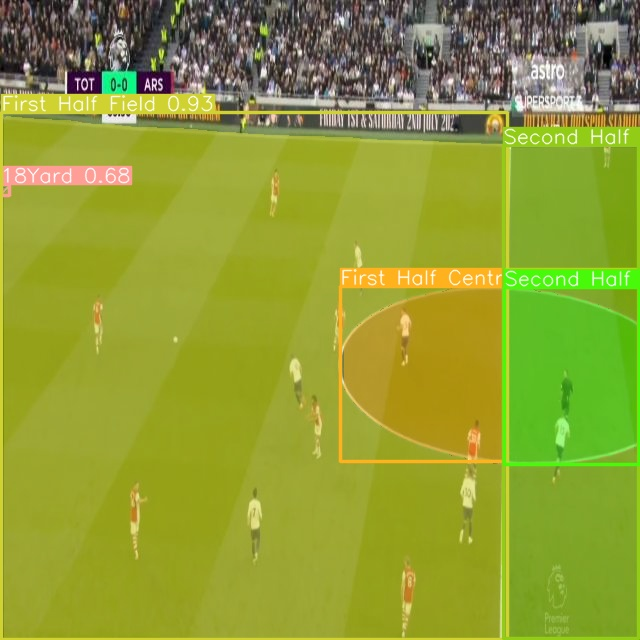

...

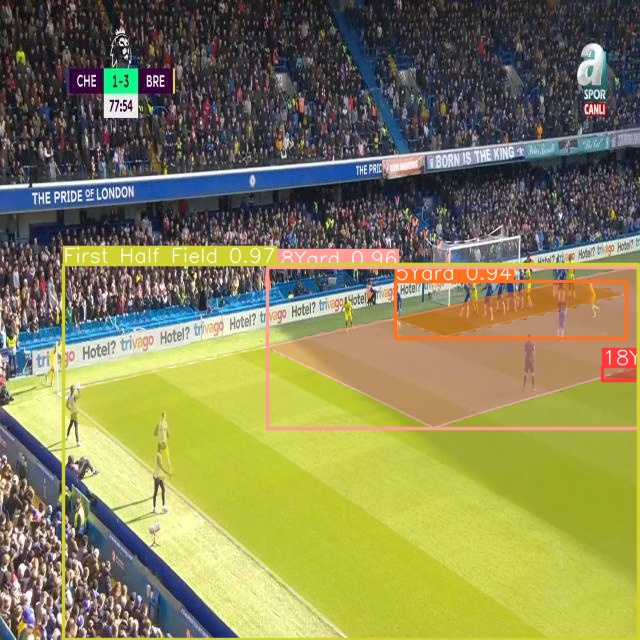

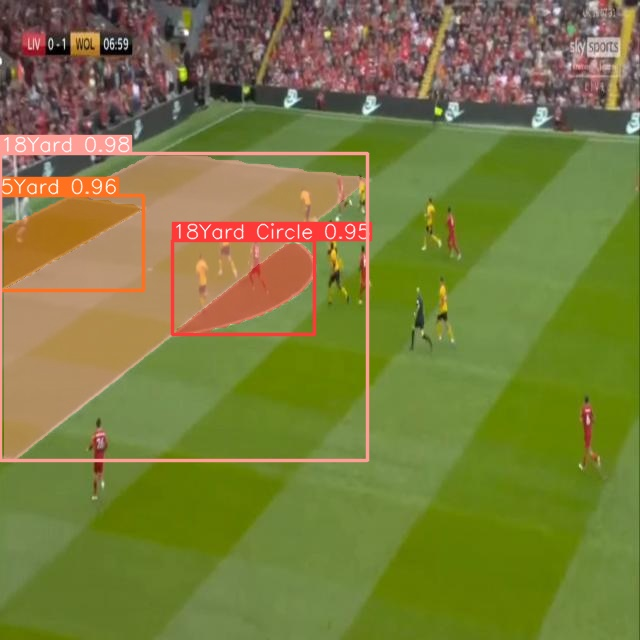

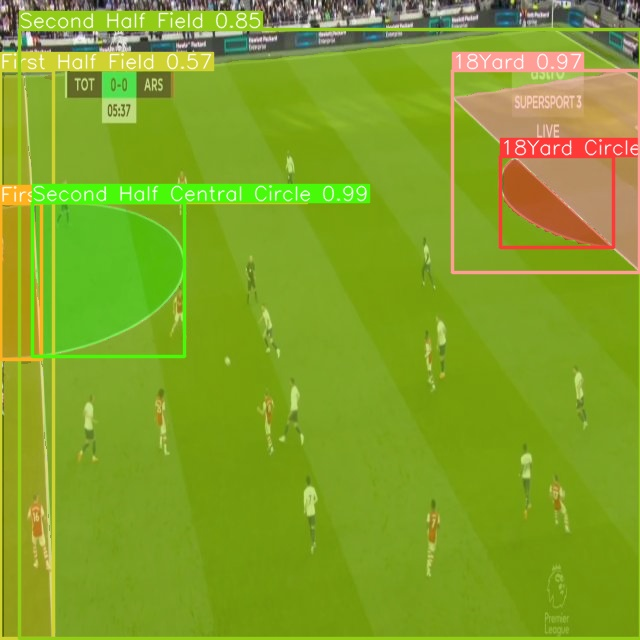

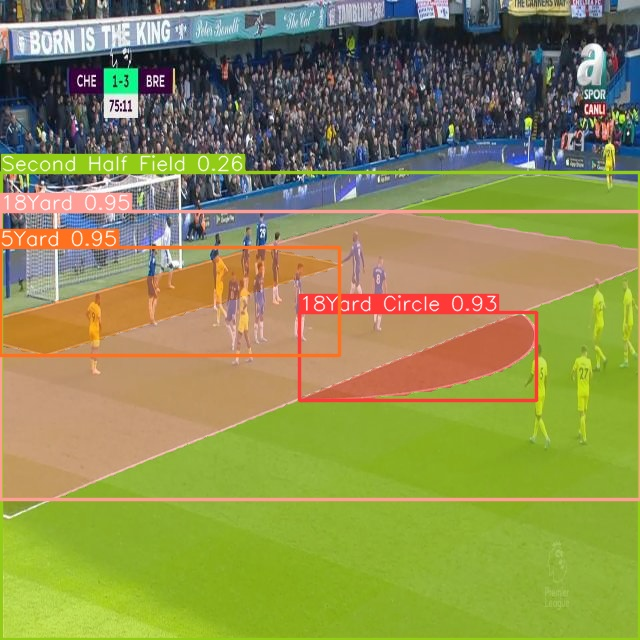

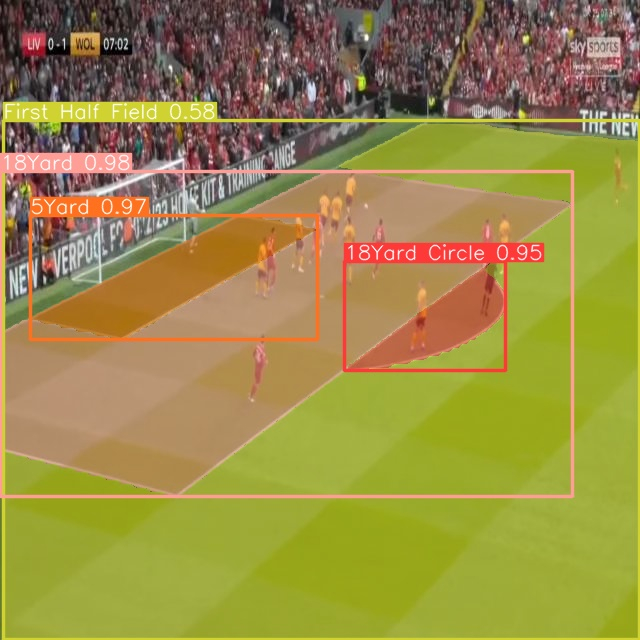

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/segment/predict2/*.jpg')[:20]:
      display(Image(filename=image_path, width=600))
      print("\n")